In [1]:
pip install pydrive

Note: you may need to restart the kernel to use updated packages.


In [22]:
import yfinance as yf
import pandas as pd
import datetime
from datetime import date
import os
import json
import gzip
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
import matplotlib.pyplot as plt

In [3]:
AMZN = yf.download(tickers = 'AMZN', period = '10Y', interval = '1d')

[*********************100%***********************]  1 of 1 completed


In [4]:
AMZN

,Open,High,Low,Close,Adj Close,Volume
Date,,,,,,
2012-12-14,12.505500,12.595000,12.389500,12.459500,12.459500,50538000
2012-12-17,12.490500,12.700000,12.463000,12.693000,12.693000,45540000
2012-12-18,12.728500,13.155500,12.728500,13.020000,13.020000,99220000
2012-12-19,13.065000,13.083500,12.884000,12.899500,12.899500,46000000
2012-12-20,12.918000,13.120500,12.827000,13.075000,13.075000,51692000
...,...,...,...,...,...,...
2022-12-08,89.239998,90.860001,87.879997,90.349998,90.349998,73305900
2022-12-09,88.900002,90.300003,88.629997,89.089996,89.089996,67316900
2022-12-12,89.209999,90.580002,87.870003,90.550003,90.550003,61999800


In [5]:
AMZN.index

DatetimeIndex(['2012-12-14', '2012-12-17', '2012-12-18', '2012-12-19',
               '2012-12-20', '2012-12-21', '2012-12-24', '2012-12-26',
               '2012-12-27', '2012-12-28',
               ...
               '2022-12-01', '2022-12-02', '2022-12-05', '2022-12-06',
               '2022-12-07', '2022-12-08', '2022-12-09', '2022-12-12',
               '2022-12-13', '2022-12-14'],
              dtype='datetime64[ns]', name='Date', length=2518, freq=None)

In [6]:
# TODO:
# Replace Timestamp column with date
# Import ALL data
# Sentiment analysis?
# Processing JSON data

In [7]:
data = "../data/ratings/Appliances.csv"

col_names = ['Item ID', 'User ID', 'Rating', 'Timestamp']

df = pd.read_csv(data, names = col_names)

In [8]:
df

,Item ID,User ID,Rating,Timestamp
0,1118461304,A3NHUQ33CFH3VM,5.0,1385510400
1,1118461304,A3SK6VNBQDNBJE,5.0,1383264000
2,1118461304,A3SOFHUR27FO3K,5.0,1381363200
3,1118461304,A1HOG1PYCAE157,5.0,1381276800
4,1118461304,A26JGAM6GZMM4V,5.0,1378512000
...,...,...,...,...
602772,B01HJH2PY0,A24A9P4F2SLTK5,5.0,1502323200
602773,B01HJHHEA0,A2JCB4KHBWEELW,2.0,1533081600
602774,B01HJHHEA0,A1LDYYVTLPP2Z5,5.0,1523577600
602775,B01HJH92JQ,AP1M5O06IOYZ7,1.0,1521763200


In [9]:
five_core_data = '../data/5-core/'
rating_data = '../data/ratings/'

col_names = ['Item ID', 'User ID', 'Rating', 'Timestamp']

five_cores = {}
five_cores_data = []

ratings = {}
ratings_data = []

# Iterate through the data
for subdir, dirs, files in os.walk(five_core_data):
    
    # For each file, get the filename and add it to the appropriate set
    for file in files:
        filename = str(os.path.join(subdir, file))
        with gzip.open(filename, "rb") as f:
            for line in f:
                line = line.decode(encoding='UTF-8')
                json_data = json.loads(line)
                five_cores_data.append(json_data)
        five_cores[filename] = five_cores_data
        
five_cores

{'../data/5-core/Appliances_5.json.gz': [{'overall': 5.0,
   'verified': True,
   'reviewTime': '08 22, 2013',
   'reviewerID': 'A34A1UP40713F8',
   'asin': 'B00009W3I4',
   'style': {'Style:': ' Dryer Vent'},
   'reviewerName': 'James. Backus',
   'reviewText': 'I like this as a vent as well as something that will keep house warmer in winter.  I sanded it and then painted it the same color as the house.  Looks great.',
   'summary': 'Great product',
   'unixReviewTime': 1377129600},
  {'overall': 5.0,
   'verified': True,
   'reviewTime': '02 8, 2016',
   'reviewerID': 'A1AHW6I678O6F2',
   'asin': 'B00009W3PA',
   'style': {'Size:': ' 6-Foot'},
   'reviewerName': 'kevin.',
   'reviewText': 'good item',
   'summary': 'Five Stars',
   'unixReviewTime': 1454889600},
  {'overall': 5.0,
   'verified': True,
   'reviewTime': '08 5, 2015',
   'reviewerID': 'A8R48NKTGCJDQ',
   'asin': 'B00009W3PA',
   'style': {'Size:': ' 6-Foot'},
   'reviewerName': 'CDBrannom',
   'reviewText': 'Fit my new 

In [10]:
def get_five_core_data(directory):
    five_core = {}
    five_core_data = []
    
    # Iterate through the data in the given directory
    for subdir, dirs, files in os.walk(directory):

        # For each file, get the filename and extract the JSON
        for file in files:
            filename = str(os.path.join(subdir, file))
            # Use gzip to open the .gz and extract each line using the normal file package
            with gzip.open(filename, "rb") as f:
                for line in f:
                    line = line.decode(encoding='UTF-8')
                    json_data = json.loads(line)
                    five_core_data.append(json_data)
            # Add data to the dict
            five_core[filename] = five_core_data
           
    # Return the dict of complete ratings from each file
    return five_core

In [11]:
test = get_five_core_data(five_core_data)
test

{'../data/5-core/Appliances_5.json.gz': [{'overall': 5.0,
   'verified': True,
   'reviewTime': '08 22, 2013',
   'reviewerID': 'A34A1UP40713F8',
   'asin': 'B00009W3I4',
   'style': {'Style:': ' Dryer Vent'},
   'reviewerName': 'James. Backus',
   'reviewText': 'I like this as a vent as well as something that will keep house warmer in winter.  I sanded it and then painted it the same color as the house.  Looks great.',
   'summary': 'Great product',
   'unixReviewTime': 1377129600},
  {'overall': 5.0,
   'verified': True,
   'reviewTime': '02 8, 2016',
   'reviewerID': 'A1AHW6I678O6F2',
   'asin': 'B00009W3PA',
   'style': {'Size:': ' 6-Foot'},
   'reviewerName': 'kevin.',
   'reviewText': 'good item',
   'summary': 'Five Stars',
   'unixReviewTime': 1454889600},
  {'overall': 5.0,
   'verified': True,
   'reviewTime': '08 5, 2015',
   'reviewerID': 'A8R48NKTGCJDQ',
   'asin': 'B00009W3PA',
   'style': {'Size:': ' 6-Foot'},
   'reviewerName': 'CDBrannom',
   'reviewText': 'Fit my new 

In [12]:
def get_ratings_data(directory):
    ratings = {}
    col_names = ['Item ID', 'User ID', 'Rating', 'Timestamp']
    
    # Iterate through the data in the given directory
    for subdir, dirs, files in os.walk(directory):

        # For each file, get the filename and extract the JSON
        for file in files:
            filename = str(os.path.join(subdir, file))
            # Create a DF of the data and add it to the dict
            df = pd.read_csv(filename, names = col_names)
            ratings[filename] = df
           
    # Return the dict of complete ratings from each file
    return ratings

In [13]:
test = get_ratings_data(rating_data)
test

{'../data/ratings/Magazine_Subscriptions.csv':           Item ID         User ID  Rating   Timestamp
 0      B00005N7P0   AH2IFH762VY5U     5.0  1005177600
 1      B00005N7P0   AOSFI0JEYU4XM     5.0  1004486400
 2      B00005N7OJ  A3JPFWKS83R49V     3.0  1174694400
 3      B00005N7OJ  A19FKU6JZQ2ECJ     5.0  1163116800
 4      B00005N7P0  A25MDGOMZ2GALN     5.0  1405296000
 ...           ...             ...     ...         ...
 89684  B01HI8V1C2   AB5HCI50SF1TK     5.0  1471305600
 89685  B01HI8V1C2  A2X11NZMPI7M0T     1.0  1470787200
 89686  B01HI8V1C2  A3EGFFBRQVO7L7     5.0  1469923200
 89687  B01HIZSSQM  A3H23AVKFN62ZT     5.0  1507161600
 89688  B01HIZSSQM  A1N6M7HRWMDE3D     5.0  1493337600
 
 [89689 rows x 4 columns],
 '../data/ratings/Appliances.csv':            Item ID         User ID  Rating   Timestamp
 0       1118461304  A3NHUQ33CFH3VM     5.0  1385510400
 1       1118461304  A3SK6VNBQDNBJE     5.0  1383264000
 2       1118461304  A3SOFHUR27FO3K     5.0  1381363200
 3     

In [14]:
def get_filename(file):
    
    # Remove any reference of directory structures in the file
    filename = file.split('/')[-1]
    
    # Remove the extension
    filename = filename.split('.')[0]
    
    # If I'm using a 5-core data file, remove the _5 that denotes that it is a 5-core
    if '_5' in filename:
        filename = filename.split('_5')[0]
                
    return filename

In [15]:
for i in test.keys():
    print(i)
    print(get_filename(i))

../data/ratings/Magazine_Subscriptions.csv
Magazine_Subscriptions
../data/ratings/Appliances.csv
Appliances


In [16]:
get_filename('test.txt')

'test'

In [20]:
AMZN = yf.download(tickers = 'AMZN', start="2017-01-01", end="2018-01-01", interval = '1d')
AMZN['Adj Close']

[*********************100%***********************]  1 of 1 completed


Date
2017-01-03    37.683498
2017-01-04    37.859001
2017-01-05    39.022499
2017-01-06    39.799500
2017-01-09    39.846001
                ...    
2017-12-22    58.417999
2017-12-26    58.838001
2017-12-27    59.112999
2017-12-28    59.305000
2017-12-29    58.473499
Name: Adj Close, Length: 251, dtype: float64

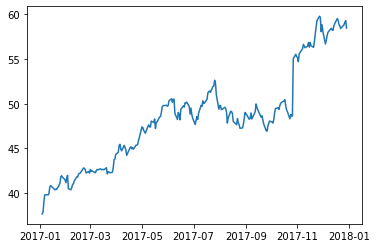

In [23]:
plt.plot(AMZN['Adj Close'])

In [25]:
def get_five_core_data(directory):
    five_core = {}
    
    # Iterate through the data in the given directory
    for subdir, dirs, files in os.walk(directory):

        # For each file, get the filename and extract the JSON
        for file in files:
            filename = str(os.path.join(subdir, file))
            print("test")
            five_core_data = []
            # Use gzip to open the .gz and extract each line using the normal file package
            with gzip.open(filename, "rb") as f:
                for line in f:
                    line = line.decode(encoding='UTF-8')
                    json_data = json.loads(line)
                    five_core_data.append(json_data)
            # Add data to the dict
            five_core[get_filename(filename)] = five_core_data
            print(get_filename(filename))
           
    # Return the dict of complete ratings from each file
    return five_core

In [26]:
five_core = get_five_core_data('../data/5-core')

test
Appliances
test
Magazine_Subscriptions


In [28]:
five_core['Appliances']

[{'overall': 5.0,
  'verified': True,
  'reviewTime': '08 22, 2013',
  'reviewerID': 'A34A1UP40713F8',
  'asin': 'B00009W3I4',
  'style': {'Style:': ' Dryer Vent'},
  'reviewerName': 'James. Backus',
  'reviewText': 'I like this as a vent as well as something that will keep house warmer in winter.  I sanded it and then painted it the same color as the house.  Looks great.',
  'summary': 'Great product',
  'unixReviewTime': 1377129600},
 {'overall': 5.0,
  'verified': True,
  'reviewTime': '02 8, 2016',
  'reviewerID': 'A1AHW6I678O6F2',
  'asin': 'B00009W3PA',
  'style': {'Size:': ' 6-Foot'},
  'reviewerName': 'kevin.',
  'reviewText': 'good item',
  'summary': 'Five Stars',
  'unixReviewTime': 1454889600},
 {'overall': 5.0,
  'verified': True,
  'reviewTime': '08 5, 2015',
  'reviewerID': 'A8R48NKTGCJDQ',
  'asin': 'B00009W3PA',
  'style': {'Size:': ' 6-Foot'},
  'reviewerName': 'CDBrannom',
  'reviewText': 'Fit my new LG dryer perfectly.',
  'summary': 'Five Stars',
  'unixReviewTime'